In [1]:
# MIT License
#
#@title Copyright (c) 2021 CCAI Community Authors { display-mode: "form" }
#
# Permission is hereby granted, free of charge, to any person obtaining a
# copy of this software and associated documentation files (the "Software"),
# to deal in the Software without restriction, including without limitation
# the rights to use, copy, modify, merge, publish, distribute, sublicense,
# and/or sell copies of the Software, and to permit persons to whom the
# Software is furnished to do so, subject to the following conditions:
#
# The above copyright notice and this permission notice shall be included in
# all copies or substantial portions of the Software.
#
# THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
# IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
# FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL
# THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
# LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING
# FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER
# DEALINGS IN THE SOFTWARE.

# CCAI Summer School Tutorial | Estimating Coal Power Plant Operation From Satellite Images with Computer Vision
Author:
*   André Ferreira, TransitionZero, andre@transitionzero.org

This tutorial addresses the application of AI for Monitoring, Reporting, and Verification, in particular for coal power emissions. In the end, you should have learnt more about:
- The gaps in emissions data
- Practical usage of freely available satellite imagery
- The application of computer vision models for the purpose of emissions monitoring

# Table of Contents


*   [Overview](#overview)
*   [Climate Impact](#climate-impact)
*   [Prerequisites](#prereq)
*   [Background on coal power plants](#background)
*   [Software Requirements](#software-requirements)
*   [Data Description](#data-description)
*   [Methodology](#methodology)
*   [Results & Discussion](#results-and-discussion)
*   [References](#references)


<a name="overview"></a>
# Overview

Over the next sections of this notebook, we'll go through the steps of how to monitor coal power plants, leveraging satellite imagery and computer vision models. In the pursuit of this goal, some of the main contributions of this tutorial are:
- A [dataset of coal power plants' emissions](https://drive.google.com/drive/folders/1_Jsl__ZcmOOYhErA9wH5QM8SPRIEgbfj?usp=share_link), including images, metadata and labels.
- A [public GitHub repository](https://github.com/AndreCNF/ccai-ss23-ai-monitoring-tutorial) with auxiliary code for creating the dataset, fetching Sentinel 2 images and training computer vision models.

<a name="climate-impact"></a>
# Climate Impact

## Data gaps

In a (data scientist's) utopian world, for every region of the world, every domain and every point in time, there would be perfectly formatted, reliable and easily accessible data. Unfortunately, that is not the case. Particularly in greenhouse gas emissions data, the quality and availability of data varies greatly, both geographically and along time. For instance, the USA has [CAMPD](https://campd.epa.gov/), where power generation and emissions are made publicly available for each power plant, on an hourly basis. Similarly, the EU has [ENTSOE](https://transparency.entsoe.eu/generation/r2/actualGenerationPerGenerationUnit/show) and Australia has [NEM](https://github.com/opennem/opennempy). But for most other areas of the world, either data of this kind of granularity is non-existent, made difficult to access or is self-reported by energy companies (with the reliability concerns that it carries). If we think outside of the power sector, such as in heavy industry or in the infamous scope 3 emissions from supply chains, data scarcity and other issues are even more problematic.

While ground-level sensors are hard to implement on a global scale and self-reported data can lead to unreliable and inconsistent data, there is one type of sensor that is global by nature: satellites. For domains where their emissions are visible from space, at least in one of the available remote sensing bands (e.g. [the 13 bands in the Sentinel 2 satellites](https://en.wikipedia.org/wiki/Sentinel-2#Spectral_bands)), we can aim to collect emission estimates across the whole world. And given that some regions have emissions data freely available, we can use that to train machine learning models so as to automate the emissions estimation process.

## Climate action from data

When faced with a challenge, it's important to have a thorough understanding of its context and our progress towards resolving it. Thus, emissions and climate data can guide us towards comprehending and addressing climate change. Furthermore, as we get a sense for the kinds of solutions that can help us achieve our mitigation and adaptation goals, such as renewable energy penetration, plant-based diets and switching from fossil fueled cars to electric and/or active methods of transport, a key step is spreading the message to bring those ideas into fruition. And while the best communication approach can vary from culture and target audience, data can help to construct a solid, fact-based narrative for climate action.

At TransitionZero, where I currently work, we have examples of using this approach of data for climate action, such as:
*   [Turning the Supertanker](https://www.transitionzero.org/insights/turning-the-supertanker) - a report on the unprofitability of coal power plants in China and how much the country could save by switching to renewable energy
*   [Japan’s toxic narrative on ammonia](https://www.transitionzero.org/insights/japans-toxic-narrative-on-ammonia-cofiring) - an analysis on the misleading emissions saving potential of co-firing ammonia with coal
*   [Two billion reasons: how Indonesia can get ahead of the net zero curve](https://www.transitionzero.org/insights/indonesia-net-zero-curve) - exploring potential pathways for Indonesia's emission cuts derived from energy systems modelling

<a name="prereq"></a>
# Prerequisites

## Hardware settings

In the methodology section, there are code cells that train deep learning models. In order to get these cells to run in a reasonably short amount of time (~11 minutes each), you should make sure that you add a GPU to your Colab notebook. You can do so by clicking on `Runtime` ➡️ `Change runtime type` ➡️ `Hardware accelerator` ➡️ `GPU`

## Power sector knowledge

You don't need to be an expert in power plants to go through this tutorial. The section bellow has some further context on coal power plants if you're interested, but it's enough to just be aware that coal power plants can be generating power (`ON`) or idle (`OFF`), producing visible plumes when `ON`.

## Machine learning knowledge

You may benefit from some knowledge of Python, PyTorch and deep learning in general, as all of these are utilised. This knowledge is particularly relevant if you want to experiment with using different models or different data approaches. You can still run all of the code and analyse the results without having to edit anything.

<a name="background"></a>
# Background on coal power plants

## Operation status

We can think of a coal power plant has having two main operational statuses: idle (`OFF`) or generating electricity (`ON`). Whithin the `ON` state, the power plant can generate different levels of energy, and cause more or less emissions in a proportional manner, which depend on its capacity (i.e. how much power can it generate at its maximum) and its capacity factor (i.e. what percentage of its capacity is it generating). But for the purposes of this tutorial, we only care about whether the power plant is `ON` or `OFF`.

Coal power plants tend to be used as baseload, i.e. being in a somewhat constant state of either `ON` or `OFF`, as can be seen later on in one of the data analysis plots, and are typically slow to ramp up and down. Thus, a snapshot of them every few days, such as from satellite images, should be enough to get a realistic picture of their operational status and emissions.

## Brief description of how a coal power plant works

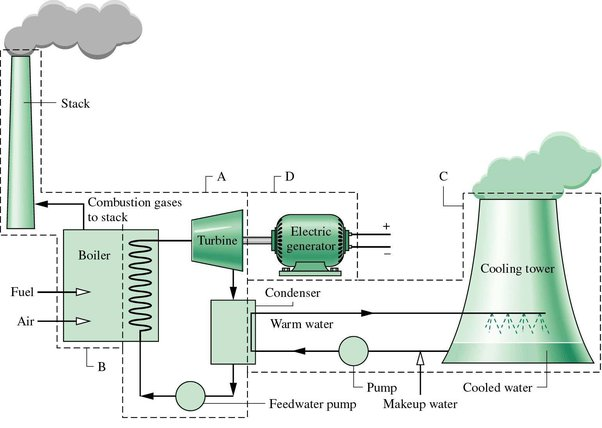

As a thermal energy source, coal power plants produce energy by heating up water and using its steam to turn a turbine. In the case of a coal power plant, it burns coal to produce the heat that steams up the water.

From an emissions standpoint, the main types of infrastructure in a coal power plant that we should care about are:
*   Flue stacks: a narrow and tall chimney where the waste gases from coal burning (including CO2) are vented out
*   Cooling technology: what's used to cool down the water that is heated up inside the power plant; some of the main cooling types are:
    *   Cooling towers: a wide and volumnous tower where the water cools down at a pool on the bottom of it while big plumes of water vapor come out
    *   Water outlet: in the once-through cooling method, the water that is pulled in to spin the turbine is then pushed straight out of the power plant (e.g. back to a river)

## Signals

Depending on the technology in use, coal power plants can have a set of signals that relate to their operational status and CO2 emissions:
*   Cooling tower plumes → generally very easily visible signal; we’ll focus on this one
    top-view-birds-eye-view-steam-pipes_518345-195.avif
*   Flue stack plumes → can be harder to spot, especially in medium to low-resolution images
    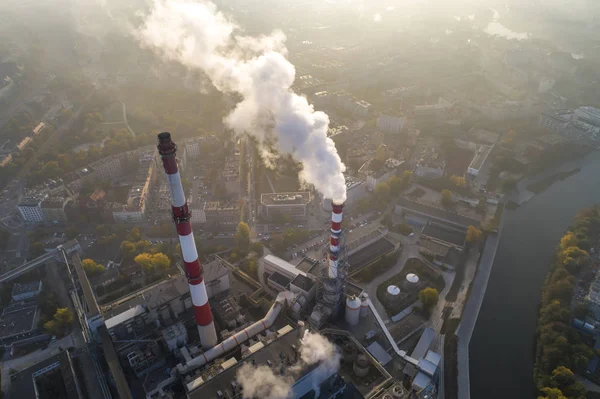
*   Flue stack and cooling tower heat → thermal data from satellites is still too low resolution to accurately model this
    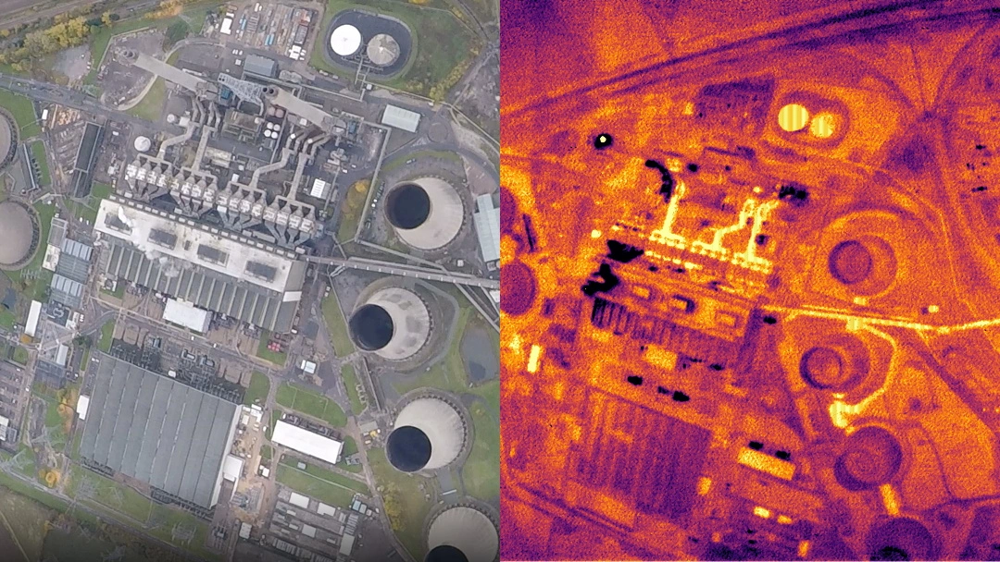
*   Cooling water flow → hard to decouple from nearby industrial activity

    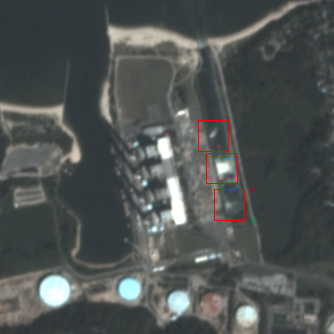


<a name="software-requirements"></a>
# Software Requirements

The main software dependency here is [coal_emissions_monitoring](https://github.com/AndreCNF/ccai-ss23-ai-monitoring-tutorial/), a Python library that was designed for this tutorial. It includes a lot of helper functions and notebooks to replicate this work, from dataset creation to machine learning model definition.

This colab was developed using Python 3.9.16, but should be able to work at least up to 3.10.

In [13]:
!python --version

Python 3.10.12


NameError: name 'version' is not defined

In [3]:
%%capture
!pip install git+https://github.com/AndreCNF/ccai-ss23-ai-monitoring-tutorial.git # in case installation fails: --use-deprecated=html5lib --use-deprecated=legacy-resolver (https://github.com/readthedocs/readthedocs.org/issues/8864#issuecomment-1025479623)
!pip install gdown
!pip install aim

In [4]:
import pandas as pd

# Data visualization
import plotly.express as px
from ipywidgets import interact
from coal_emissions_monitoring.data_viz import view_satellite_image

# Data processing
import geopandas as gpd
from coal_emissions_monitoring.dataset import CoalEmissionsDataModule

# Model training
import torch
import timm
import lightning as L
from lightning import Trainer
from lightning.pytorch.callbacks import EarlyStopping, ModelCheckpoint
from coal_emissions_monitoring.model import CoalEmissionsModel, SmallCNN

# Others
import os

/mnt/wsl/PHYSICALDRIVE1p1/@home/non/envs/.ccai/lib/python3.10/site-packages/pystac_client/client.py:186: NoConformsTo: Server does not advertise any conformance classes.
  warnings.warn(NoConformsTo())


In [5]:
# Experiment tracking
%load_ext aim
from aim.pytorch_lightning import AimLogger

# run "aim telemetry off" in CLI

In [6]:
# set the random seed for reproducibility
L.seed_everything(42)

Global seed set to 42


42

<a name="data-description"></a>
# Data Description

The data in this tutorial has been assembled using a combination of the following sources:
*   [AWS' Sentinel 2 L2A collection](https://registry.opendata.aws/sentinel-2-l2a-cogs/): satellite images made available both as the typical visible light images and as multispectral images; visual bands have a spatial resolution of 10 metres (i.e. each pixel represents ~10x10 square metres on the ground).
*   [Google's geospatial classification demo](https://github.com/GoogleCloudPlatform/python-docs-samples/blob/main/people-and-planet-ai/geospatial-classification/labeled_geospatial_data.csv): dataset of timestamps and coordinates of cooling towers, with a label on whether or not its associated power plant was operating.

Our goal in the end is to be able to estimate the operation status of coal power plants through the satellite images, which is a proxy of their emissions.

The data has already been collected and processed in the [coal_emissions_monitoring](https://github.com/AndreCNF/ccai-ss23-ai-monitoring-tutorial/) repo, but feel free to check it for more information on how it was done. The main step taken there was downloading satellite images and associating them to each row of the labelled dataset.

## Data Download
All of the data required for this tutorial is made available in [this public Google Drive folder](https://drive.google.com/drive/folders/1ywJduPZYqOfPi3Sung93dlZnlmvYTOfK). We're just going to download it to this notebook's disk.

In [7]:
!gdown --folder https://drive.google.com/drive/folders/1MFt93CLrQyUJb6219-HAVE-zftle3bGP

Retrieving folder list
Processing file 1WFoOl0ZvwwZa_1h0kqnEea6S1_Qpw1vd all_bands_images.tar.gz
Processing file 18SD5R6wC8o8kIam7tIKF-G14F3ekLsnx all_urls_dataset.csv
Processing file 108K86FujrqF7qRMHFceHX4t9Ai-wZdai final_dataset.csv
Processing file 1bQwmHMvGoI2ZjSccEtvz60NbhM6_EOBI image_metadata.csv
Processing file 1O8RBVZr5qAQbVNGfakjuUxKCYCpmmihO labeled_geospatial_data.csv
Processing file 1ogTrkbvhZ5A7lfuP4lxzjDznj_2aIN-5 visual_images.tar.gz
Retrieving folder list completed
Building directory structure
Building directory structure completed
Access denied with the following error:

 	Cannot retrieve the public link of the file. You may need to change
	the permission to 'Anyone with the link', or have had many accesses. 

You may still be able to access the file from the browser:

	 https://drive.google.com/uc?id=1WFoOl0ZvwwZa_1h0kqnEea6S1_Qpw1vd 

Download ended unsuccessfully


## Data Preprocessing

Here we're going to decompress our satellite images, configure a dataset and explore what's in the data.

Get the images from the compressed file (takes ~2 minutes):

In [20]:
!mkdir ./google/images
!tar -C ./google/images -xf google/visual_images.tar.gz
!rm -rf ./google/visual_images.tar.gz
images_path = "./google/images/visual"

mkdir: cannot create directory ‘./google/images’: File exists
tar: google/visual_images.tar.gz: Cannot open: No such file or directory
tar: Error is not recoverable: exiting now


Setup the dataset:

In [22]:
batch_size = 64     # how many samples to use in each batch of model training
crop_size = 64      # what's the size in pixels to crop the satellite images to

In [23]:
data = CoalEmissionsDataModule(
    final_dataset_path="./google/final_dataset.csv", # path to the CSV file that contains the dataset that we're training on
    batch_size=batch_size,                                  # how many samples to use in each batch of model training
    crop_size=crop_size,                                    # what's the size in pixels to crop the satellite images to
    num_workers=os.cpu_count(),                             # how many workers to use to fetch the next batches of data while the model trains
    predownload_images=True,                                # whether to use predownloaded images or download them on the fly (very slow)
    download_missing_images=True,                          # whether or not to download any images that are missing from the dataset
    images_dir=images_path,                                 # path to where the images are saved on disk
)

In [24]:
# prepare the data for model training, i.e.
# • load the dataset table
# • filter out cloudy images (>50% of the satellite tile)
# • make sure that images are already downloaded and on the right path
# • split non-2020 data into training and validation sets, based on random spatial assignment
data.setup("fit")

2023-09-15 01:07:30.306 | WARNING  | coal_emissions_monitoring.satellite_imagery:fetch_image_path_from_cog:404 - Failed to download image https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/33U/UA2020/8/S2B_33UUA_20200804_0_L2A/TCI.tif. Original error:
'/vsicurl/https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/33U/UA2020/8/S2B_33UUA_20200804_0_L2A/TCI.tif' does not exist in the file system, and is not recognized as a supported dataset name.
2023-09-15 01:07:31.405 | WARNING  | coal_emissions_monitoring.satellite_imagery:fetch_image_path_from_cog:404 - Failed to download image https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/33U/UA2020/8/S2B_33UUA_20200807_0_L2A/TCI.tif. Original error:
'/vsicurl/https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/33U/UA2020/8/S2B_33UUA_20200807_0_L2A/TCI.tif' does not exist in the file system, and is not recognized as a supported dataset name.
/mnt/wsl/PHYSICALDRIVE1p1/@home/

In [25]:
# prepare the data for testing the model, i.e.
# • load the dataset table
# • filter out cloudy images (>50% of the satellite tile)
# • make sure that images are already downloaded and on the right path
# • assign all 2020 data to the test set
data.setup("test")

2023-09-15 01:08:00.267 | WARNING  | coal_emissions_monitoring.satellite_imagery:fetch_image_path_from_cog:404 - Failed to download image https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/33U/UA2020/8/S2B_33UUA_20200804_0_L2A/TCI.tif. Original error:
'/vsicurl/https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/33U/UA2020/8/S2B_33UUA_20200804_0_L2A/TCI.tif' does not exist in the file system, and is not recognized as a supported dataset name.
2023-09-15 01:08:01.337 | WARNING  | coal_emissions_monitoring.satellite_imagery:fetch_image_path_from_cog:404 - Failed to download image https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/33U/UA2020/8/S2B_33UUA_20200807_0_L2A/TCI.tif. Original error:
'/vsicurl/https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/33U/UA2020/8/S2B_33UUA_20200807_0_L2A/TCI.tif' does not exist in the file system, and is not recognized as a supported dataset name.
/mnt/wsl/PHYSICALDRIVE1p1/@home/

Explore the dataset:

In [26]:
data.train_dataset.gdf

,ts,latitude,longitude,is_powered_on,facility_id,geometry,cloud_cover,cog_url,local_image_path,data_set
592,2019-06-22 10:46:55+00:00,50.99360,6.66418,1,15,"POLYGON ((6.66859 50.99657, 6.66888 50.99082, ...",25.04,https://sentinel-cogs.s3.us-west-2.amazonaws.c...,./google/images/visual/S2A_32ULB_20190622_0_L2...,train
481,2018-07-07 10:45:15.680000+00:00,50.99311,6.66457,1,12,"POLYGON ((6.66898 50.99608, 6.66927 50.99033, ...",1.46,https://sentinel-cogs.s3.us-west-2.amazonaws.c...,./google/images/visual/S2A_32ULB_20180707_0_L2...,train
667,2019-12-04 10:46:45.525000+00:00,50.99400,6.66879,1,17,"POLYGON ((6.67320 50.99697, 6.67349 50.99122, ...",3.88,https://sentinel-cogs.s3.us-west-2.amazonaws.c...,./google/images/visual/S2B_31UGS_20191204_0_L2...,train
1936,2017-07-07 10:40:22.460000+00:00,51.67680,7.97625,0,44,"POLYGON ((7.98081 51.67972, 7.98094 51.67396, ...",47.48,https://sentinel-cogs.s3.us-west-2.amazonaws.c...,./google/images/visual/S2B_32UMC_20170707_0_L2...,train
2914,2017-09-30 09:50:13.460000+00:00,51.27131,19.32624,1,66,"POLYGON ((19.33072 51.27425, 19.33093 51.26850...",11.84,https://sentinel-cogs.s3.us-west-2.amazonaws.c...,./google/images/visual/S2B_33UYS_20170930_0_L2...,train
...,...,...,...,...,...,...,...,...,...,...
4280,2018-07-02 10:40:21.460000+00:00,50.83896,6.31914,1,92,"POLYGON ((6.32352 50.84194, 6.32384 50.83619, ...",0.00,https://sentinel-cogs.s3.us-west-2.amazonaws.c...,./google/images/visual/S2B_32ULB_20180702_0_L2...,train
1150,2019-08-13 16:34:10.286000+00:00,34.12500,-84.92487,1,28,"POLYGON ((-84.92133 34.12783, -84.92147 34.122...",9.43,https://sentinel-cogs.s3.us-west-2.amazonaws.c...,./google/images/visual/S2A_16SFC_20190813_0_L2...,train
2856,2018-09-25 09:55:55.370000+00:00,51.27130,19.32160,1,64,"POLYGON ((19.32608 51.27424, 19.32629 51.26849...",36.35,https://sentinel-cogs.s3.us-west-2.amazonaws.c...,./google/images/visual/S2B_33UYS_20180925_0_L2...,train
2295,2019-05-18 16:43:00+00:00,37.92798,-87.03403,1,52,"POLYGON ((-87.03039 37.93087, -87.03039 37.925...",2.48,https://sentinel-cogs.s3.us-west-2.amazonaws.c...,./google/images/visual/S2A_16SDG_20190518_0_L2...,train


For a clearer understanding, here's a description of each column in the dataset above:
*   `ts` - timestamp of when the operation status (i.e. `is_powered_on`) was recorded
*   `latitude` - latitude coordinate of the centre of the cooling tower
*   `longitude` - longitude coordinate of the centre of the cooling tower
*   `is_powered_on` - operation status of the power plant at the time `ts`; it's the label that we're going to estimate with our machine learning models; `1` means the power plant was `ON` (i.e. generating electricity), `0` is `OFF`
*   `facility_id` - unique identifier of the cooling tower
*   `geometry` - square-shaped geometry centred on the cooling tower, with dimensions of 640 x 640 metres, which represents 64 x 64 pixels in the Sentinel 2 satellite images
*   `cloud_cover` - percentage, from 0 to 100, that represents how much of the original satellite tile (which is 110 x 110 km) is estimated to be covered by clouds; **it's an important column** as clouds can obscure the power plants and trick our models to think that it's seeing cooling plumes; this is calculated using a combination of remote sensing arithmatics, you can see more information about it [here](https://sentinels.copernicus.eu/web/sentinel/technical-guides/sentinel-2-msi/level-1c/cloud-masks)
*   `cog_url` - URL for the Cloud Optimised GeoTIFF (COG) that contains the image that is relevant for the respective row (i.e. contains an image of the `geometry` taken at the date `ts`)
*   `local_image_path` - path to the image that was cropped from the `cog_url` using `geometry`, saved on the local disk
*   `data_set` - group that the respective sample corresponds to; can be `train`, if it's going to be used to train the model; `val`, if it's being used to validate the model's performance during training; `test`, if it's going to be used to test the model in unseen data after training

In [27]:
print(
f"""
Training data stats:
• Number of rows: {len(data.train_dataset.gdf)}
• Number of power plants: {data.train_dataset.gdf.facility_id.nunique()}
• Time range: {data.train_dataset.gdf.ts.min()} - {data.train_dataset.gdf.ts.max()}

Validation data stats:
• Number of rows: {len(data.val_dataset.gdf)}
• Number of power plants: {data.val_dataset.gdf.facility_id.nunique()}
• Time range: {data.val_dataset.gdf.ts.min()} - {data.val_dataset.gdf.ts.max()}

Test data stats:
• Number of rows: {len(data.test_dataset.gdf)}
• Number of power plants: {data.test_dataset.gdf.facility_id.nunique()}
• Time range: {data.test_dataset.gdf.ts.min()} - {data.test_dataset.gdf.ts.max()}
"""
)


Training data stats:
• Number of rows: 3305
• Number of power plants: 133
• Time range: 2016-11-17 10:58:28+00:00 - 2021-04-27 10:46:46.734000+00:00

Validation data stats:
• Number of rows: 926
• Number of power plants: 23
• Time range: 2016-12-05 10:14:12.680000+00:00 - 2021-05-04 10:38:51.055000+00:00

Test data stats:
• Number of rows: 1885
• Number of power plants: 156
• Time range: 2020-01-02 10:26:23.818000+00:00 - 2020-12-31 09:18:43.139000+00:00



Note that the train/validation split is a spatial split, randomly allocating facilities to either the training or the validation set. This means that each unique cooling tower can either be in the training or validation set, but not on both at the same time. Precautions were taken to ensure that cooling towers that are very near each other, to the point of appearing in each others' images, would always be in the same set, so as to avoid leakage (e.g. similar images appearing both during training and validation, which could result in misleadingly high performance). For more information on this, check the `get_facility_set_mapper` function in [ccai-ss23-ai-monitoring-tutorial](https://github.com/AndreCNF/ccai-ss23-ai-monitoring-tutorial).

The test set includes all power plants but only has 2020 data, while the other sets have data for the years of 2016, 2017, 2018, 2019 and 2021.

In [28]:
px.line(
    data.train_dataset.gdf.sort_values("ts"),
    x="ts",
    y="is_powered_on",
    color="facility_id",
    title="Operation status per power plant over time (training set)",
)

/mnt/wsl/PHYSICALDRIVE1p1/@home/non/envs/.ccai/lib/python3.10/site-packages/_plotly_utils/basevalidators.py:105: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  v = v.dt.to_pydatetime()


Above you can see the time series of all of the cooling towers' operation status (`is_powered_on`). To see each cooling tower one at a time, you can double click on its `facility_id` on the legend in the right side of the graph.

You can notice that, while some cooling towers have some variations in their power generation, most spend the majority of the time generating power (`is_powered_on` = `1`).

In [29]:
all_co2_data = pd.concat(
    [
        data.train_dataset.gdf[["data_set", "is_powered_on"]],
        data.val_dataset.gdf[["data_set", "is_powered_on"]],
    ]
)
all_co2_data = (
    all_co2_data
    .groupby(["data_set", "is_powered_on"])
    .value_counts()
    .rename("number of samples")
    .to_frame()
    .reset_index()
)
all_co2_data.is_powered_on = all_co2_data.is_powered_on.apply(
    lambda x: "ON" if x == 1 else "OFF"
)
all_co2_data.rename(columns={"is_powered_on": "operation status"}, inplace=True)
px.bar(
    all_co2_data,
    x="operation status",
    y="number of samples",
    title="Histogram of operation status",
    color="data_set",
    barmode="group",
)

The histogram above reinforces the idea that coal power plants are generating electricity very often.

As the operation status is the label that we want to classify with a machine learning model, this disparity between positive and negative states actually constitutes a problem called an unbalanced dataset. With one class (`ON`) having many more observations than the other (`OFF`), if handled incorrectly it could trick our models to always predict that a power plant is `ON`. Fortunately there are ways to counteract this issue, such as applying a smaller weight to `ON` samples in the model's loss function, which makes the model pay relatively more attention to `OFF` samples.

In [30]:
all_cloud_data = pd.concat(
    [
        data.train_dataset.gdf[["data_set", "cloud_cover"]],
        data.val_dataset.gdf[["data_set", "cloud_cover"]],
    ]
)
px.histogram(
    all_cloud_data,
    x="cloud_cover",
    title="Histogram of cloud cover",
    color="data_set",
)

The cloud cover histogram shows us that most images are relatively cloudless, with most of them having between 0% to 0.5% clouds (and this is an estimate over the entire tile that the satellite captured, not just on the small patch that we extracted). So hopefully clouds won't be much of an issue.

Note that, in this plot, `cloud_cover` is represented as a percentage of the satellite tile.

Map of the cooling towers in the dataset, split by training and validation set:

(note that the squares represent the size and shape of the images that were retrieved for each cooling tower on each timestamp)

In [33]:
# facilities_to_map = data.train_dataset.gdf[["facility_id", "geometry", "data_set"]].drop_duplicates()
# facilities_to_map = facilities_to_map.append(data.val_dataset.gdf[["facility_id", "geometry", "data_set"]].drop_duplicates())
# pandas.DataFrame.append is now depreciated since v1.4.0 and the use of pd.concat is recommended
# 
facilities_to_map = pd.concat([data.train_dataset.gdf[["facility_id", "geometry", "data_set"]], data.val_dataset.gdf[["facility_id", "geometry", "data_set"]]])
facilities_to_map.explore(column="data_set", cmap=["blue", "red"])

/mnt/wsl/PHYSICALDRIVE1p1/@home/non/envs/.ccai/lib/python3.10/site-packages/geopandas/explore.py:400: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



<a name="methodology"></a>
# Methodology

## Core model

For the purposes of this tutorial, a relatively simple model was defined from scratch, based on common features of modern Convolutional Neural Networks. You can read the model's definition in the `SmallCNN` class of `coal_emissions_monitoring.model`. It consists of:
*   6 convolutional layers with `ReLU` activation function
*   2 max pooling layers interspersed between the convolutional layers
*   1 adaptive average pooling layer after the final convolutional layer
*   1 fully connected layer in the end for estimating the final logit (i.e. the value that is used to estimate if a cooling tower is `ON` or `OFF`)

You are encouraged to try using other models, such as those made available in [Hugging Face's timm library](https://huggingface.co/docs/timm), but note that most popular computer vision models were developed with larger image sizes (e.g. 256 x 256 pixels instead of our current maximum size of 64 x 64 pixels).

## Early stopping

In order to be productive with training time, we're using a common technique called early stopping. What it does is end model training if a specific validation metric hasn't improved for a certain number of training epochs. In this case, we're early stopping model training if the loss on the validation set doesn't decrease for 10 consecutive epochs.

## Model checkpoints

As we monitor model performance during training, we can keep an eye on when is the model performing at its best. Since it's not guaranteed that the best model will be the one that comes out at the very end of training, we use model checkpoints to continuously save the model whenever we detect a new best performance over a given metric (in this case, its the balanced accuracy over the validation set).

## PyTorch Lightning


There are many different Python libraries to develop machine learning code. In this tutorial, we're using [Pytorch Lightning](https://www.pytorchlightning.ai/index.html), a neat wrapper around [PyTorch](https://pytorch.org/), currently [the most used machine learning library in the world](https://paperswithcode.com/trends), which simplifies code and gives us a consistent, structured approach to defining models and datasets.

## Aim to visualise and compare modelling experiments

Below we'll start an [Aim](https://aimstack.io/) experiment tracker. This can be very useful to visually compare multiple modelling experiments, as it tracks many metrics and parameters automatically, and presents them in a nice interface.

Note that when running it before training any models it will be empty. You need to train models in the cells coming afterwards to actually see models showing up here.

For the purposes of this tutorial, I suggest that you focus on the following metrics:
*   **Balanced accuracy:** a proxy to how often the model is correct in its predictions, while taking into account the disparate number of samples of each class (this is to address the unbalanced dataset that we discussed previously); the closest this number is to 1 the better, while a lower number closer to 0.5 is worse, i.e. we want to maximise this metric
*   **Loss:** an error value that, in the case of the training set data, is directly used in the machine learning optimisation; along the model training, we should see this value decrease, quickly at first and then slowly plateauing in a low value; we want to minimise this metric

All metrics should improve on the training set data quite smoothly, even if it has a few ups and downs, given that it is the data that the model is directly optimising for. We're always likely to have worse performance in the validation and test sets, but the performance there is relevant to see how well the model generalises to new data.

In [ ]:
%aim up

For a better experience using Aim, I suggest clicking on the `Open in new browser tab` button above (once you've run all of the code until one of the model training cells bellow) and appending the following to the URL:

```url
metrics?grouping=O-JTdCJTIyY29sb3IlMjI6JTVCJTIycnVuLnByb3BzLm5hbWUlMjIlNUQsJTIyc3Ryb2tlJTIyOiU1QiUyMmNvbnRleHQuc3Vic2V0JTIyJTVELCUyMmNoYXJ0JTIyOiU1QiUyMm5hbWUlMjIlNUQsJTIycmV2ZXJzZU1vZGUlMjI6JTdCJTIyY29sb3IlMjI6ZmFsc2UsJTIyc3Ryb2tlJTIyOmZhbHNlLCUyMmNoYXJ0JTIyOmZhbHNlJTdELCUyMmlzQXBwbGllZCUyMjolN0IlMjJjb2xvciUyMjp0cnVlLCUyMnN0cm9rZSUyMjp0cnVlLCUyMmNoYXJ0JTIyOnRydWUlN0QsJTIycGVyc2lzdGVuY2UlMjI6JTdCJTIyY29sb3IlMjI6dHJ1ZSwlMjJzdHJva2UlMjI6dHJ1ZSU3RCwlMjJzZWVkJTIyOiU3QiUyMmNvbG9yJTIyOjEwLCUyMnN0cm9rZSUyMjoxMCU3RCwlMjJwYWxldHRlSW5kZXglMjI6MCU3RA&chart=O-JTdCJTIyaGlnaGxpZ2h0TW9kZSUyMjoyLCUyMmlnbm9yZU91dGxpZXJzJTIyOmZhbHNlLCUyMnpvb20lMjI6JTdCJTIyYWN0aXZlJTIyOmZhbHNlLCUyMm1vZGUlMjI6MSwlMjJoaXN0b3J5JTIyOiU1QiU1RCU3RCwlMjJheGVzU2NhbGVUeXBlJTIyOiU3QiUyMnhBeGlzJTIyOiUyMmxpbmVhciUyMiwlMjJ5QXhpcyUyMjolMjJsaW5lYXIlMjIlN0QsJTIyYXhlc1NjYWxlUmFuZ2UlMjI6JTdCJTIyeUF4aXMlMjI6JTdCJTdELCUyMnhBeGlzJTIyOiU3QiU3RCU3RCwlMjJzbW9vdGhpbmclMjI6JTdCJTIyYWxnb3JpdGhtJTIyOiUyMkVYUE9ORU5USUFMX01PVklOR19BVkVSQUdFJTIyLCUyMmZhY3RvciUyMjowLjYsJTIyY3VydmVJbnRlcnBvbGF0aW9uJTIyOiUyMmN1cnZlTGluZWFyJTIyLCUyMmlzQXBwbGllZCUyMjp0cnVlJTdELCUyMmFsaWdubWVudENvbmZpZyUyMjolN0IlMjJtZXRyaWMlMjI6JTIyJTIyLCUyMnR5cGUlMjI6JTIyc3RlcCUyMiU3RCwlMjJkZW5zaXR5VHlwZSUyMjo1MDAsJTIyYWdncmVnYXRpb25Db25maWclMjI6JTdCJTIybWV0aG9kcyUyMjolN0IlMjJhcmVhJTIyOjEsJTIybGluZSUyMjowJTdELCUyMmlzQXBwbGllZCUyMjpmYWxzZSwlMjJpc0VuYWJsZWQlMjI6dHJ1ZSU3RCwlMjJ0b29sdGlwJTIyOiU3QiUyMmFwcGVhcmFuY2UlMjI6JTIyYXV0byUyMiwlMjJkaXNwbGF5JTIyOnRydWUsJTIyc2VsZWN0ZWRGaWVsZHMlMjI6JTVCJTVEJTdELCUyMmxlZ2VuZHMlMjI6JTdCJTIyZGlzcGxheSUyMjp0cnVlLCUyMm1vZGUlMjI6JTIycGlubmVkJTIyJTdELCUyMmZvY3VzZWRTdGF0ZSUyMjolN0IlMjJhY3RpdmUlMjI6ZmFsc2UsJTIya2V5JTIyOiUyMk8tSlRkQ0pUSXljblZ1U0dGemFDVXlNam9sTWpJNU1UQXlaV0V3TlRNMU5tVTBOekJrWVRneE9EWmpabVlsTWpJc0pUSXliV1YwY21salRtRnRaU1V5TWpvbE1qSnNiM056SlRJeUxDVXlNblJ5WVdObFEyOXVkR1Y0ZENVeU1qb2xOMElsTjBRbE4wUSUyMiwlMjJ4VmFsdWUlMjI6MTA4NSwlMjJ5VmFsdWUlMjI6MC4xMDY2MjI3ODUzLCUyMmNoYXJ0SW5kZXglMjI6MSwlMjJ2aXNJZCUyMjolMjIxJTIyJTdEJTdE&select=O-JTdCJTIyb3B0aW9ucyUyMjolNUIlN0IlMjJsYWJlbCUyMjolMjJiYWxhbmNlZF9hY2N1cmFjeSUyMiwlMjJncm91cCUyMjolMjJiYWxhbmNlZF9hY2N1cmFjeSUyMiwlMjJ0eXBlJTIyOiUyMm1ldHJpY3MlMjIsJTIyY29sb3IlMjI6JTIyI0U4ODUzRCUyMiwlMjJrZXklMjI6JTIyTy1KVGRDSlRJeWJXVjBjbWxqVG1GdFpTVXlNam9sTWpKaVlXeGhibU5sWkY5aFkyTjFjbUZqZVNVeU1pd2xNakpqYjI1MFpYaDBUbUZ0WlNVeU1qb2xNaklsTWpJbE4wUSUyMiwlMjJ2YWx1ZSUyMjolN0IlMjJvcHRpb25fbmFtZSUyMjolMjJiYWxhbmNlZF9hY2N1cmFjeSUyMiwlMjJjb250ZXh0JTIyOm51bGwlN0QlN0QsJTdCJTIybGFiZWwlMjI6JTIybG9zcyUyMiwlMjJncm91cCUyMjolMjJsb3NzJTIyLCUyMnR5cGUlMjI6JTIybWV0cmljcyUyMiwlMjJjb2xvciUyMjolMjIjM0U3MkU3JTIyLCUyMmtleSUyMjolMjJPLUpUZENKVEl5YldWMGNtbGpUbUZ0WlNVeU1qb2xNakpzYjNOekpUSXlMQ1V5TW1OdmJuUmxlSFJPWVcxbEpUSXlPaVV5TWlVeU1pVTNSQSUyMiwlMjJ2YWx1ZSUyMjolN0IlMjJvcHRpb25fbmFtZSUyMjolMjJsb3NzJTIyLCUyMmNvbnRleHQlMjI6bnVsbCU3RCU3RCU1RCwlMjJxdWVyeSUyMjolMjIlMjIsJTIyYWR2YW5jZWRNb2RlJTIyOmZhbHNlLCUyMmFkdmFuY2VkUXVlcnklMjI6JTIyJTIyJTdE
```

This will show you a dashboard that compares modelling experiments on the balanced accuracy and loss metrics, where each experiment has its own colour and each set (training or validation) its own stroke.

## Train a model over the entire training set

**Note:** these cells should take around 10-15 minutes to run. Feel free to go make yourself a coffee while you wait ☕️

In [ ]:
model = SmallCNN(num_input_channels=3, num_classes=1)
lit_model = CoalEmissionsModel(
    model=model,
    learning_rate=1e-3,
    pos_weight=data.pos_weight,
)
trainer = Trainer(
    max_epochs=100,
    callbacks=[
        EarlyStopping(monitor="val_loss", mode="min", patience=10, min_delta=0.00),
        ModelCheckpoint(
            dirpath="/content/models/",
            filename="{val_loss:.3f}-{val_balanced_accuracy:.1%}-{epoch}-full_data",
            monitor="val_balanced_accuracy",
            mode="max",
        ),
    ],
    limit_train_batches=round(1 * len(data.train_dataset.gdf) / batch_size),
    limit_val_batches=round(1 * len(data.val_dataset.gdf) / batch_size),
    reload_dataloaders_every_n_epochs=1,
    precision="16-mixed",
    accelerator="gpu",
    logger=AimLogger(experiment="full_data"),
    log_every_n_steps=1,
)
trainer.fit(lit_model, data)

In [ ]:
_ = trainer.test(
    model=lit_model,
    dataloaders=data,
    ckpt_path="best",
    verbose=True,
)

In [ ]:
#@title Load validation set predictions to visualise outputs
for batch in data.val_dataloader():
    break
preds = lit_model(batch["image"])
# apply sigmoid to the predictions to get a value between 0 and 1
preds = torch.sigmoid(preds)

In [ ]:
#@title Visualise predictions over the validation batch
# import plotly.graph_objs as go
# fig = go.FigureWidget()
# fig.show()
global fig

@interact
def view_pred_sample(sample_index = range(len(preds))):
    global fig
    print(f"Reported power plant operation: {'ON' if batch['target'][sample_index] == 1 else 'OFF'}")
    print(f"Estimated power plant operation: {'ON' if preds[sample_index] > 0.5 else 'OFF'} (probability: {preds[sample_index]:.1%})")
    fig = view_satellite_image(batch["image"][sample_index])

In [ ]:
# run this cell after selecting the sample index above
# to view the image
fig

## Train a model using a smaller crop size

**Note:** these cells should take around 10-15 minutes to run. Feel free to go make yourself a coffee while you wait ☕️

The reasoning behind using a smaller crop size is to further focus the model on each cooling tower's output. The larger the image, the more we get of background and potentially irrelevant context.

e.g. an image of 128x128 pixels would correspond to 1.28 km width and length on the ground, which would add a lot of noise to what we actually want to model, which are the plumes (or the lack there of) coming out of cooling towers.

In [ ]:
data = CoalEmissionsDataModule(
    final_dataset_path="/content/google/final_dataset.csv",
    batch_size=batch_size,
    crop_size=32,
    num_workers=os.cpu_count(),
    predownload_images=True,
    download_missing_images=False,
    images_dir=images_path,
)
data.setup("fit")
model = SmallCNN(num_input_channels=3, num_classes=1)
lit_model = CoalEmissionsModel(
    model=model,
    learning_rate=1e-3,
    pos_weight=data.pos_weight,
)
trainer = Trainer(
    max_epochs=100,
    callbacks=[
        EarlyStopping(monitor="val_loss", mode="min", patience=10, min_delta=0.00),
        ModelCheckpoint(
            dirpath="/content/models/",
            filename="{val_loss:.3f}-{val_balanced_accuracy:.1%}-{epoch}-smaller_crop",
            monitor="val_balanced_accuracy",
            mode="max",
        ),
    ],
    limit_train_batches=round(1 * len(data.train_dataset.gdf) / batch_size),
    limit_val_batches=round(1 * len(data.val_dataset.gdf) / batch_size),
    reload_dataloaders_every_n_epochs=1,
    precision="16-mixed",
    accelerator="gpu",
    logger=AimLogger(experiment="smaller_crop"),
    log_every_n_steps=1,
)
trainer.fit(lit_model, data)

In [ ]:
_ = trainer.test(
    model=lit_model,
    dataloaders=data,
    ckpt_path="best",
    verbose=True,
)

In [ ]:
#@title Load validation set predictions to visualise outputs
for batch in data.val_dataloader():
    break
preds = lit_model(batch["image"])
# apply sigmoid to the predictions to get a value between 0 and 1
preds = torch.sigmoid(preds)

In [ ]:
#@title Visualise predictions over the validation batch
# import plotly.graph_objs as go
# fig = go.FigureWidget()
# fig.show()
global fig

@interact
def view_pred_sample(sample_index = range(len(preds))):
    global fig
    print(f"Reported power plant operation: {'ON' if batch['target'][sample_index] == 1 else 'OFF'}")
    print(f"Estimated power plant operation: {'ON' if preds[sample_index] > 0.5 else 'OFF'} (probability: {preds[sample_index]:.1%})")
    fig = view_satellite_image(batch["image"][sample_index])

In [ ]:
# run this cell after selecting the sample index above
# to view the image
fig

## Train a model using a more strict cloud filter

**Note:** these cells should take around 10-15 minutes to run. Feel free to go make yourself a coffee while you wait ☕️

The images provided in this tutorial were obtained using a 50% cloud filter. This could still let through some images with clouds, which can reduce the quality of our dataset. It's relevant then to experiment with stricter cloud filters.

In [ ]:
data = CoalEmissionsDataModule(
    final_dataset_path="/content/google/final_dataset.csv",
    batch_size=batch_size,
    crop_size=crop_size,
    num_workers=os.cpu_count(),
    predownload_images=True,
    download_missing_images=False,
    images_dir=images_path,
    max_cloud_cover_prct=5,
)
data.setup("fit")
model = SmallCNN(num_input_channels=3, num_classes=1)
lit_model = CoalEmissionsModel(
    model=model,
    learning_rate=1e-3,
    pos_weight=data.pos_weight,
)
trainer = Trainer(
    max_epochs=100,
    callbacks=[
        EarlyStopping(monitor="val_loss", mode="min", patience=10, min_delta=0.00),
        ModelCheckpoint(
            dirpath="/content/models/",
            filename="{val_loss:.3f}-{val_balanced_accuracy:.1%}-{epoch}-less_clouds",
            monitor="val_balanced_accuracy",
            mode="max",
        ),
    ],
    limit_train_batches=round(1 * len(data.train_dataset.gdf) / batch_size),
    limit_val_batches=round(1 * len(data.val_dataset.gdf) / batch_size),
    reload_dataloaders_every_n_epochs=1,
    precision="16-mixed",
    accelerator="gpu",
    logger=AimLogger(experiment="less_clouds"),
    log_every_n_steps=1,
)
trainer.fit(lit_model, data)

In [ ]:
_ = trainer.test(
    model=lit_model,
    dataloaders=data,
    ckpt_path="best",
    verbose=True,
)

In [ ]:
#@title Load validation set predictions to visualise outputs
for batch in data.val_dataloader():
    break
preds = lit_model(batch["image"])
# apply sigmoid to the predictions to get a value between 0 and 1
preds = torch.sigmoid(preds)

In [ ]:
#@title Visualise predictions over the validation batch
# import plotly.graph_objs as go
# fig = go.FigureWidget()
# fig.show()
global fig

@interact
def view_pred_sample(sample_index = range(len(preds))):
    global fig
    print(f"Reported power plant operation: {'ON' if batch['target'][sample_index] == 1 else 'OFF'}")
    print(f"Estimated power plant operation: {'ON' if preds[sample_index] > 0.5 else 'OFF'} (probability: {preds[sample_index]:.1%})")
    fig = view_satellite_image(batch["image"][sample_index])

In [ ]:
# run this cell after selecting the sample index above
# to view the image
fig

<a name="results-and-discussion"></a>
# Results & Discussion

| Test metric         | Full training data | Smaller crop size | Stricter cloud filter |
|---------------------|--------------------|-------------------|-----------------------|
| accuracy            | 75.15%             | 74.08%            | 78.71%                |
| balanced accuracy   | 83.76%             | 76.15%            | 49.70%                |
| loss                | 0.131              | 0.167             | 0.234                 |
| precision           | 99.28%             | 93.86%            | 81.60%                |
| recall              | 69.65%             | 72.62%            | 95.40%                |


As we can confirm both from the validation and particularly the test set metrics, the first model trained with the largest 64 x 64 crop size and on the full training data is the best performing one (on my side, I got 83.76% balanced accuracy, 99.28% precision, 69.65% recall and 0.13 loss on the test set).

While recall can come across as a worse metric, being < 70%, it's worth remembering that we're using one individual cooling tower to assess the operation of a power plant. A power plant can have multiple cooling towers and flue stacks from which plumes come out of. It's often the case that a power plant is operating but there's only visible plumes in some of its cooling towers. Thus, with our dataset of cooling tower images, we're bound to have false negatives of not seeing any activity on a specific cooling tower while ther power plant is actually running.

Potential reasons for why it's performing better having a larger crop size:
*   A larger crop size gives more context to the model, allowing it to see other infrastructure of the power plant, such as more cooling towers and flue stacks, and being able to see more of the plume if there is one
*   With a larger image comes more features to work with, which can be benefitial for the model

Potential reasons for why it's performing better when being less strict about cloud cover:
*   Using a less strict cloud filter allows for more images to be used for training the model; with a larger dataset, there's a tendency for reaching better model performance
*   Cloud cover is only estimated using remote sensing methods; it can sometimes mistake power plant plumes for clouds and thus discard perfectly acceptable images

## Limitations

Despite having trained a model that reached an interesting performance and that generalised well to the validation and test sets, there are still some limitations to this approach, such as:
*   While it's useful to know whether a power plant is operating or not, this doesn't give us very specific emissions estimates; we would need to either work on top of these outputs or change the modelling approach to estimate CO2 emissions (see the [Climate TRACE Power sector - Electricity Generation Methodology](https://github.com/climatetracecoalition/methodology-documents/blob/main/Power/Power%20sector-%20Electricity%20Generation%20Methodology.pdf))
*   When relying on visible spectrum imagery from satellites, as we did here, we're hampered by weather factors such as clouds, snow and bright objects on the ground
*   This tutorial only modelled cooling towers of coal power plants; there are coal power plants that don't use cooling towers (or at least not ones that generate clearly visible plumes) and there are other power plants that aren't fuelled by coal; this means that for countries with a relatively low amount of coal power (e.g. Brazil) and countries with different types of prevailing cooling technology (e.g. Japan), this coal cooling tower modelling approach will be less useful to get country-level insights
*   Our data was all located in the US and Europe; without testing on samples from other locations in the world that have some form of ground truth labels, we don't know how well the models generalise to the rest of the world

## Next Steps

There are many more experiments that can be done to try to improve emissions estimates from satellite images. Here are some suggestions to consider:

*   Use more Sentinel 2 bands (the [folder on Google Drive](https://drive.google.com/drive/folders/1MFt93CLrQyUJb6219-HAVE-zftle3bGP) contains images with all of the bands)
*   Add spatial indices
*   Explore a time-series approach
*   Explore pixel-wise, tabular approach
*   Work on a specific emissions estimation step
*   Try different models, including ones pre-trained on Sentinel 2 imagery
*   Add training data from other regions, by extracting power generation data
*   Tackle other types of power plants, such as ones with flue gas desulfurisation

<a name="references"></a>
# References

*   [Climate TRACE Power sector - Electricity Generation Methodology](https://github.com/climatetracecoalition/methodology-documents/blob/main/Power/Power%20sector-%20Electricity%20Generation%20Methodology.pdf)
*   [A data centric approach to modeling CO2 emissions from power plants](https://youtu.be/ZhfhLy7kRxA)
*   [Towards Tracking the Emissions of Every Power Plant on the Planet](https://www.climatechange.ai/papers/neurips2020/11)
*   [Turning the Supertanker](https://www.transitionzero.org/insights/turning-the-supertanker)
*   [Sentinel-2 Cloud-Optimized GeoTIFFs](https://registry.opendata.aws/sentinel-2-l2a-cogs/)
*   [Sentinel 2 bands](https://en.wikipedia.org/wiki/Sentinel-2#Spectral_bands)
*   [Google's People and Planet AI series - Coal Plant Predictions -- geospatial-classification](https://colab.research.google.com/github/GoogleCloudPlatform/python-docs-samples/blob/main/people-and-planet-ai/geospatial-classification/README.ipynb)
*   [PyTorch Lightning](https://lightning.ai/pages/open-source/pytorch-lightning/)
*   [CAMPD](https://campd.epa.gov/)
*   [ENTSOE](https://transparency.entsoe.eu/generation/r2/actualGenerationPerGenerationUnit/show)
*   [NEM](https://github.com/opennem/opennempy)